In [4]:
# hest_loading.py (或者一个单独的 qc_utils.py 文件)

# 请确保这些库已安装：
# pip install opencv-python-headless scikit-image tqdm
import cv2
import numpy as np
import openslide
import os
from tqdm import tqdm
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from typing import Dict, Optional

# 假设 HESTSample 类已在上面定义
# from hest_loading import HESTSample 

def calculate_wsi_qc_metrics_by_tiling(
    sample: 'HESTSample',
    num_tiles: int = 50,
    tile_size: int = 512,
    tissue_min_std: float = 8.0
) -> Dict:
    """
    通过对高分辨率瓦片进行采样来计算 WSI 的 QC 指标，这比缩放整个图像更准确。

    该过程如下：
    1. 使用低分辨率缩略图快速识别组织区域。
    2. 在这些组织区域内随机选择 `num_tiles` 个瓦片的位置。
    3. 使用 OpenSlide 从 WSI 的最高分辨率层 (level 0) 读取每个瓦片。
    4. 对每个包含足够信息的瓦片计算 QC 指标。
    5. 聚合所有有效瓦片的指标（例如，取平均值）以获得整个切片的代表性分数。

    参数:
      sample (HESTSample): 要分析的 HEST 样本对象。
      num_tiles (int): 要采样的瓦片数量。数量越多，结果越准确，但计算时间越长。
      tile_size (int): 每个瓦片的像素尺寸 (正方形)。
      tissue_min_std (float): 灰度瓦片的最小标准差，低于此值被视为空白背景。
                               用于过滤掉位于组织区域边缘的空白瓦片。

    返回:
      dict: 包含所有计算出的 QC 指标的字典。
    """
    # 初始化指标字典
    qc_results = {
        'sample_id': sample.sample_id,
        'file_size_mb': np.nan,
        'tissue_area_fraction': np.nan,
        'mean_brightness': np.nan,
        'mean_contrast': np.nan,
        'mean_blurriness_laplacian': np.nan,
        'mean_hematoxylin_intensity': np.nan,
        'mean_eosin_intensity': np.nan,
        'num_valid_tiles': 0
    }

    # 1. 加载 WSI 并进行基本检查
    wsi = sample.load_wsi()
    if not wsi:
        print(f"无法加载 WSI 用于 {sample.sample_id}，跳过 QC。")
        return qc_results

    try:
        qc_results['file_size_mb'] = os.path.getsize(sample.wsi_path) / (1024 * 1024)
        
        # 获取最高分辨率的尺寸
        level0_dims = wsi.level_dimensions[0]

        # 2. 使用低分辨率缩略图识别组织区域
        thumb_downsample = 64
        thumb = sample.get_wsi_thumbnail(level=0, downsample=thumb_downsample)
        
        if thumb.size == 0:
            print(f"无法为 {sample.sample_id} 生成缩略图。")
            return qc_results
            
        gray_thumb = cv2.cvtColor(thumb, cv2.COLOR_RGB2GRAY)
        
        # 使用 Otsu 阈值法创建组织掩码（通常组织比背景暗）
        try:
            thresh_val = threshold_otsu(gray_thumb)
            tissue_mask_thumb = (gray_thumb < thresh_val)
        except ValueError: # 如果图像是纯色，Otsu 会失败
            tissue_mask_thumb = np.zeros(gray_thumb.shape, dtype=bool)

        # 计算全局组织面积比例
        if tissue_mask_thumb.size > 0:
            qc_results['tissue_area_fraction'] = np.mean(tissue_mask_thumb)
        
        # 获取组织区域在缩略图上的坐标
        tissue_y_thumb, tissue_x_thumb = np.where(tissue_mask_thumb)

        if len(tissue_x_thumb) == 0:
            print(f"在 {sample.sample_id} 中未检测到组织。")
            return qc_results

        # 3. 在组织区域内随机选择瓦片坐标
        random_indices = np.random.choice(len(tissue_x_thumb), size=num_tiles, replace=True)
        
        # 将缩略图坐标映射回 level 0 的坐标
        top_left_x_coords = tissue_x_thumb[random_indices] * thumb_downsample
        top_left_y_coords = tissue_y_thumb[random_indices] * thumb_downsample

        # 存储每个有效瓦片的指标
        tile_metrics = {
            'brightness': [], 'contrast': [], 'blurriness_laplacian': [],
            'hematoxylin': [], 'eosin': []
        }

        # 4. 循环处理每个瓦片
        for x, y in tqdm(zip(top_left_x_coords, top_left_y_coords), total=num_tiles, desc=f"Tiling {sample.sample_id}", leave=False):
            # 确保瓦片不会超出图像边界
            if x + tile_size > level0_dims[0] or y + tile_size > level0_dims[1]:
                continue
            
            # 读取高分辨率瓦片
            tile_pil = wsi.read_region((int(x), int(y)), 0, (tile_size, tile_size))
            tile_np = np.array(tile_pil.convert("RGB"))

            # 5. 对瓦片进行有效性检查和 QC 计算
            gray_tile = cv2.cvtColor(tile_np, cv2.COLOR_RGB2GRAY)
            
            # 检查瓦片是否主要是背景
            if gray_tile.std() < tissue_min_std:
                continue # 跳过这个空白/低信息量的瓦片

            # 计算指标
            tile_metrics['brightness'].append(np.mean(gray_tile))
            tile_metrics['contrast'].append(np.std(gray_tile))
            tile_metrics['blurriness_laplacian'].append(cv2.Laplacian(gray_tile, cv2.CV_64F).var())

            # 颜色分解
            hed_tile = rgb2hed(tile_np)
            hematoxylin_channel = hed_tile[:, :, 0]
            eosin_channel = hed_tile[:, :, 1]
            
            # 在瓦片内部再次进行组织分割，以获得更精确的染色强度
            try:
                tile_thresh_val = threshold_otsu(gray_tile)
                tile_tissue_mask = gray_tile < tile_thresh_val
                if np.sum(tile_tissue_mask) > 0:
                    tile_metrics['hematoxylin'].append(np.mean(hematoxylin_channel[tile_tissue_mask]))
                    tile_metrics['eosin'].append(np.mean(eosin_channel[tile_tissue_mask]))
            except ValueError:
                continue # 如果瓦片是纯色，跳过

        # 6. 聚合结果
        num_valid_tiles = len(tile_metrics['brightness'])
        qc_results['num_valid_tiles'] = num_valid_tiles

        if num_valid_tiles > 0:
            qc_results['mean_brightness'] = np.mean(tile_metrics['brightness'])
            qc_results['mean_contrast'] = np.mean(tile_metrics['contrast'])
            qc_results['mean_blurriness_laplacian'] = np.mean(tile_metrics['blurriness_laplacian'])
            if tile_metrics['hematoxylin']: # 确保列表不为空
                qc_results['mean_hematoxylin_intensity'] = np.mean(tile_metrics['hematoxylin'])
            if tile_metrics['eosin']: # 确保列表不为空
                qc_results['mean_eosin_intensity'] = np.mean(tile_metrics['eosin'])
        
        return qc_results

    except openslide.OpenSlideError as e:
        print(f"OpenSlide 错误 (样本 {sample.sample_id}): {e} - 可能文件损坏或格式不受支持。")
        return qc_results
    except Exception as e:
        print(f"处理样本 {sample.sample_id} 时发生未知错误: {e}")
        return qc_results
    finally:
        if wsi:
            wsi.close()

In [12]:
# --- 安装必要的库 ---
# 请确保您已按照上述说明安装了 libvips 系统库
# pip install pyvips opencv-python scikit-image tqdm

import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from IPython.display import display, Image as IPImage

# 导入 pyvips 库
try:
    import pyvips
except ImportError:
    print("错误: pyvips 库未找到。请按照单元格上方的说明进行安装。")
    # 在 Notebook 中，我们可以用 raise 来停止执行
    raise

# 使用 tqdm.notebook 可以在 Notebook 中显示更好看的进度条
from tqdm.auto import tqdm

os.chdir("/home1/jijh/diffusion_project/ADiffusion")
os.getcwd()

import importlib
from src.pipeline.hest_loading import HESTDataset, HESTSample

# --- 全局设置 ---
DATA_DIR = "/cwStorage/nodecw_group/jijh/hest_1k" 

# 1. 初始化数据集
print(f"正在从 '{DATA_DIR}' 加载数据集...")
dataset = HESTDataset(data_dir=DATA_DIR)
print("数据集元数据加载成功。")

# 2. 选择样本进行分析
print("\n正在查询所有样本以进行高分辨率 WSI QC 分析...")
samples_to_analyze = dataset.get_samples()
print(f"总共找到 {len(samples_to_analyze)} 个样本。")

正在从 '/cwStorage/nodecw_group/jijh/hest_1k' 加载数据集...
数据集元数据加载成功。

正在查询所有样本以进行高分辨率 WSI QC 分析...
总共找到 1229 个样本。


In [6]:
import threading

import concurrent.futures

# 使用已有的 samples_to_analyze 变量而不是重新创建
all_qc_results = []
results_lock = threading.Lock()

def process_sample_wrapper(sample):
    """包装函数用于并行处理"""
    try:
        qc_metrics = calculate_wsi_qc_metrics_by_tiling(
            sample, 
            num_tiles=100,  # 增加瓦片数量以获得更稳健的结果
            tile_size=512
        )
        return qc_metrics
    except Exception as e:
        print(f"处理样本 {sample.sample_id} 时出错: {e}")
        return None

# 使用ProcessPoolExecutor进行并行处理
with concurrent.futures.ProcessPoolExecutor(max_workers=8) as executor:
    # 提交所有任务
    future_to_sample = {executor.submit(process_sample_wrapper, sample): sample 
                       for sample in samples_to_analyze}
    
    # 收集结果
    for future in tqdm(concurrent.futures.as_completed(future_to_sample), 
                      total=len(samples_to_analyze), desc="Processing Samples"):
        result = future.result()
        if result is not None:
            with results_lock:
                all_qc_results.append(result)

qc_df = pd.DataFrame(all_qc_results)
print(qc_df.head())

# 保存结果
qc_df.to_csv("wsi_tiling_qc_results.csv", index=False)

Processing Samples:   0%|          | 0/1229 [00:00<?, ?it/s]

  sample_id  file_size_mb  tissue_area_fraction  mean_brightness  \
0   TENX159    877.788456              0.743433       192.312514   
1   TENX158   1413.413090              0.494895       173.198525   
2   TENX157   2685.771782              0.553679       165.730459   
3   TENX153   6787.269865              0.365756       159.464721   
4   TENX155   6965.814749              0.396210       159.317260   

   mean_contrast  mean_blurriness_laplacian  mean_hematoxylin_intensity  \
0      24.311973                  28.619413                    0.038233   
1      37.405470                  97.300392                    0.030662   
2      35.982560                  89.691723                    0.029486   
3      35.410142                 141.557090                    0.007541   
4      35.082703                 156.844862                    0.024608   

   mean_eosin_intensity  num_valid_tiles  
0              0.028832               97  
1              0.043641               98  
2          

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import cv2
import openslide
import math
from tqdm import tqdm


def plot_qc_distributions(qc_df: pd.DataFrame):
    """
    分析并可视化 QC 指标的分布。

    参数:
      qc_df (pd.DataFrame): 包含 QC 结果的 DataFrame。
    """
    print("--- 1. QC 指标统计摘要 ---")
    # 仅选择数值列进行描述
    numeric_df = qc_df.select_dtypes(include=np.number)
    print(numeric_df.describe())
    print("\n")

    # 定义要可视化的关键指标
    metrics_to_plot = [
        'mean_blurriness_laplacian',
        'mean_contrast',
        'mean_brightness',
        'mean_hematoxylin_intensity',
        'tissue_area_fraction',
        'file_size_mb'
    ]
    
    # 过滤掉不存在于 DataFrame 中的列
    metrics_to_plot = [m for m in metrics_to_plot if m in qc_df.columns]

    print("--- 2. 绘制 QC 指标分布图 ---")
    num_metrics = len(metrics_to_plot)
    fig, axes = plt.subplots(math.ceil(num_metrics / 2), 2, figsize=(15, 4 * math.ceil(num_metrics / 2)))
    axes = axes.flatten()

    for i, metric in enumerate(metrics_to_plot):
        if qc_df[metric].notna().sum() > 1: # 确保有足够的数据来绘图
            sns.histplot(data=qc_df, x=metric, kde=True, ax=axes[i])
            axes[i].set_title(f'Distribution of {metric}')
            # 在图上标记中位数
            median_val = qc_df[metric].median()
            axes[i].axvline(median_val, color='r', linestyle='--', label=f'Median: {median_val:.2f}')
            axes[i].legend()
        else:
            axes[i].text(0.5, 0.5, f"Not enough data for\n{metric}", ha='center', va='center')
            axes[i].set_axis_off()

    # 隐藏多余的子图
    for j in range(i + 1, len(axes)):
        axes[j].set_axis_off()

    plt.tight_layout()
    plt.show()


def visualize_sample_tiles(
    sample: HESTSample,
    num_tiles: int = 9,
    tile_size: int = 512,
    title_prefix: str = ""
):
    """
    从单个 WSI 中提取并显示一组随机的高分辨率瓦片。

    参数:
      sample (HESTSample): 要可视化的样本。
      num_tiles (int): 要显示的瓦片数量。
      tile_size (int): 每个瓦片的尺寸。
      title_prefix (str): 添加到图像网格标题前的前缀。
    """
    wsi = sample.load_wsi()
    if not wsi:
        print(f"无法为 {sample.sample_id} 加载 WSI。")
        return

    try:
        # --- 复用 QC 计算中的逻辑来定位组织 ---
        level0_dims = wsi.level_dimensions[0]
        thumb_downsample = 64
        thumb = sample.get_wsi_thumbnail(level=0, downsample=thumb_downsample)
        if thumb.size == 0: return
        
        gray_thumb = cv2.cvtColor(thumb, cv2.COLOR_RGB2GRAY)
        try:
            thresh_val = cv2.threshold(gray_thumb, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[0]
            tissue_mask_thumb = (gray_thumb < thresh_val)
        except cv2.error: # 如果图像是纯色，Otsu 会失败
            tissue_mask_thumb = np.zeros(gray_thumb.shape, dtype=bool)

        tissue_y_thumb, tissue_x_thumb = np.where(tissue_mask_thumb)

        if len(tissue_x_thumb) == 0:
            print(f"在 {sample.sample_id} 中未检测到组织，无法采样瓦片。")
            return

        # 随机选择瓦片坐标
        random_indices = np.random.choice(len(tissue_x_thumb), size=num_tiles, replace=True)
        top_left_x_coords = tissue_x_thumb[random_indices] * thumb_downsample
        top_left_y_coords = tissue_y_thumb[random_indices] * thumb_downsample
        # --- 组织定位结束 ---

        # 设置绘图网格
        grid_size = math.ceil(math.sqrt(num_tiles))
        fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
        axes = axes.flatten()
        fig.suptitle(f"{title_prefix}: {sample.sample_id}", fontsize=16)

        for i, (x, y) in enumerate(zip(top_left_x_coords, top_left_y_coords)):
            if i >= len(axes): break
            # 读取高分辨率瓦片
            tile_pil = wsi.read_region((int(x), int(y)), 0, (tile_size, tile_size))
            tile_np = np.array(tile_pil.convert("RGB"))
            
            axes[i].imshow(tile_np)
            axes[i].axis('off')

        # 隐藏多余的子图
        for j in range(i + 1, len(axes)):
            axes[j].set_axis_off()

        plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
        plt.show()

    finally:
        if wsi:
            wsi.close()




--- 1. QC 指标统计摘要 ---
       file_size_mb  tissue_area_fraction  mean_brightness  mean_contrast  \
count   1229.000000           1229.000000      1229.000000    1229.000000   
mean     737.075648              0.298293       159.624624      35.048793   
std     1215.085061              0.163373        32.587414      11.914087   
min       13.479453              0.011639        13.101176      11.322501   
25%       96.880244              0.164397       138.468121      27.331267   
50%      205.643323              0.276580       165.381805      33.248552   
75%      663.253484              0.395607       184.133340      41.719284   
max     9602.708759              0.972063       220.694716     102.793113   

       mean_blurriness_laplacian  mean_hematoxylin_intensity  \
count                1229.000000                 1229.000000   
mean                  337.076437                    0.085109   
std                   677.511471                    0.100265   
min                     2.697

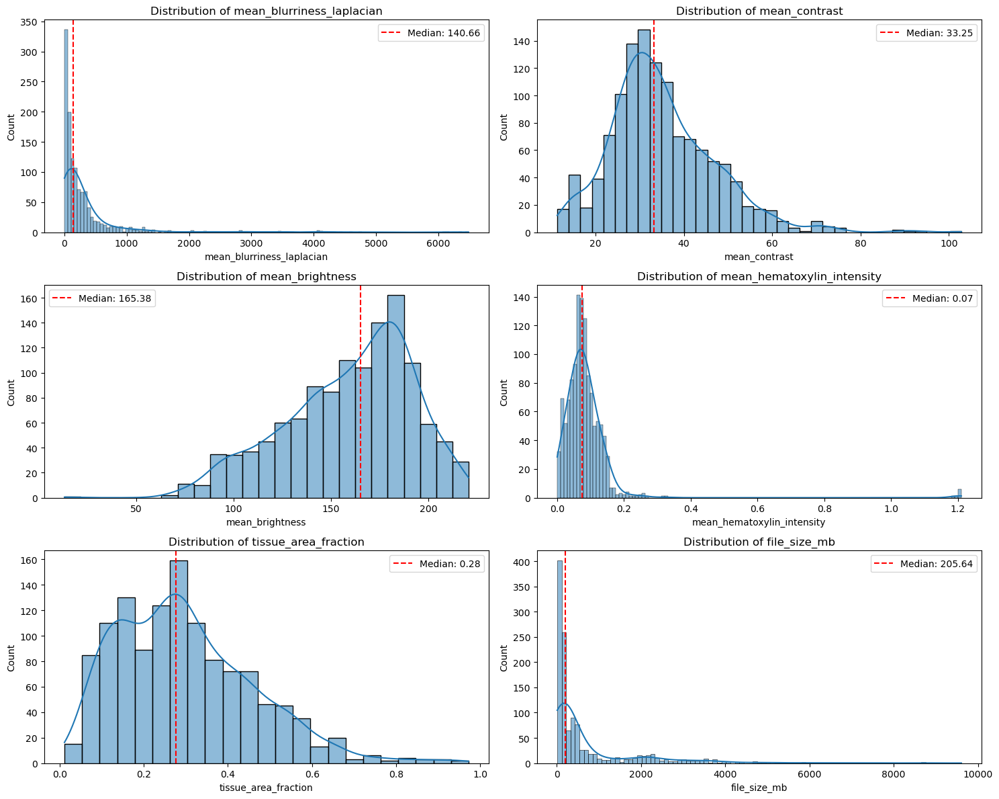


--- 3. 识别和对比样本瓦片 ---
最模糊的样本: NCBI660 (模糊度得分: 2.70)
正常的样本 (接近中位数): NCBI154 (模糊度得分: 140.66)


/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 38382 (\N{CJK UNIFIED IDEOGRAPH-95EE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 39064 (\N{CJK UNIFIED IDEOGRAPH-9898}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 26679 (\N{CJK UNIFIED IDEOGRAPH-6837}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 26412 (\N{CJK UNIFIED IDEOGRAPH-672C}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 20302 (\N{CJK UNIFIED IDEOGRAPH-4F4E}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 27169 (\N{

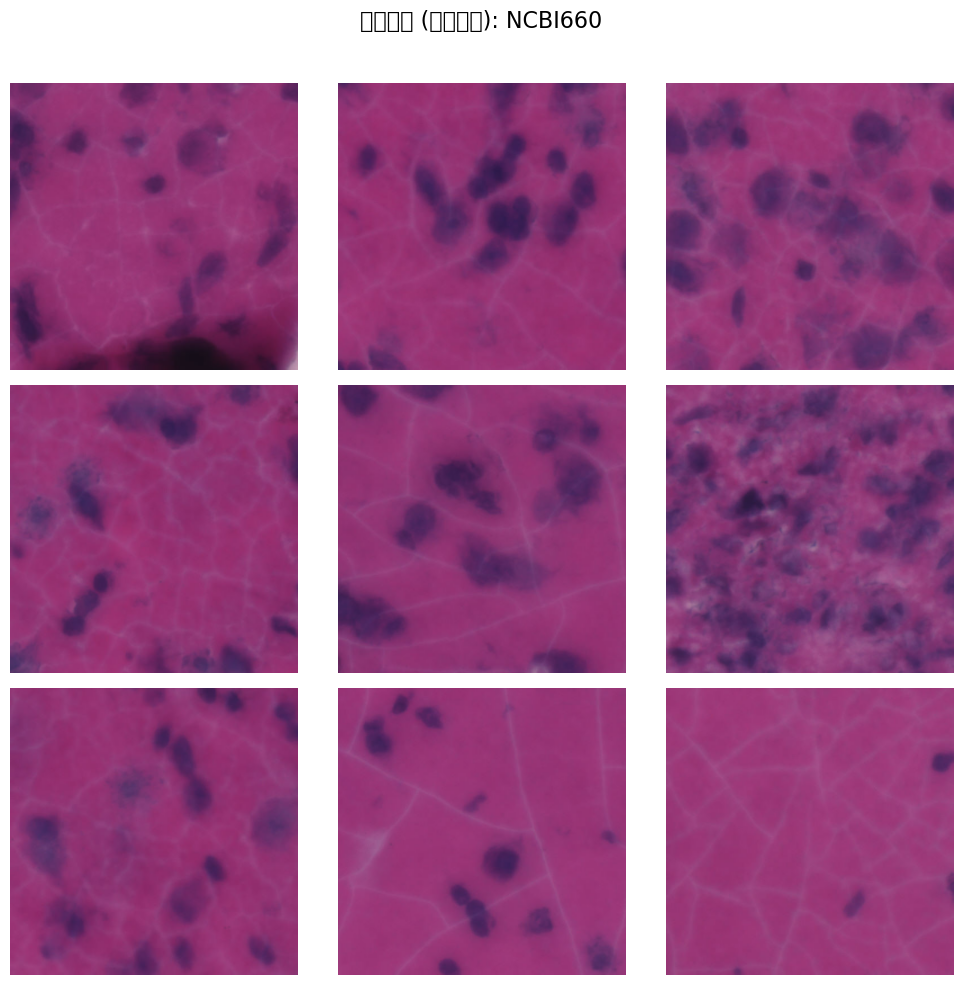

/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 27491 (\N{CJK UNIFIED IDEOGRAPH-6B63}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 24120 (\N{CJK UNIFIED IDEOGRAPH-5E38}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 20013 (\N{CJK UNIFIED IDEOGRAPH-4E2D}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/tmp/ipykernel_422725/3906581716.py:128: UserWarning: Glyph 20301 (\N{CJK UNIFIED IDEOGRAPH-4F4D}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # 调整布局以适应标题
/public/home/jijh/micromamba/envs/imgprocess/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27491 (\N{CJK UNIFIED IDEOGRAPH-6B63}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/public/home/jij

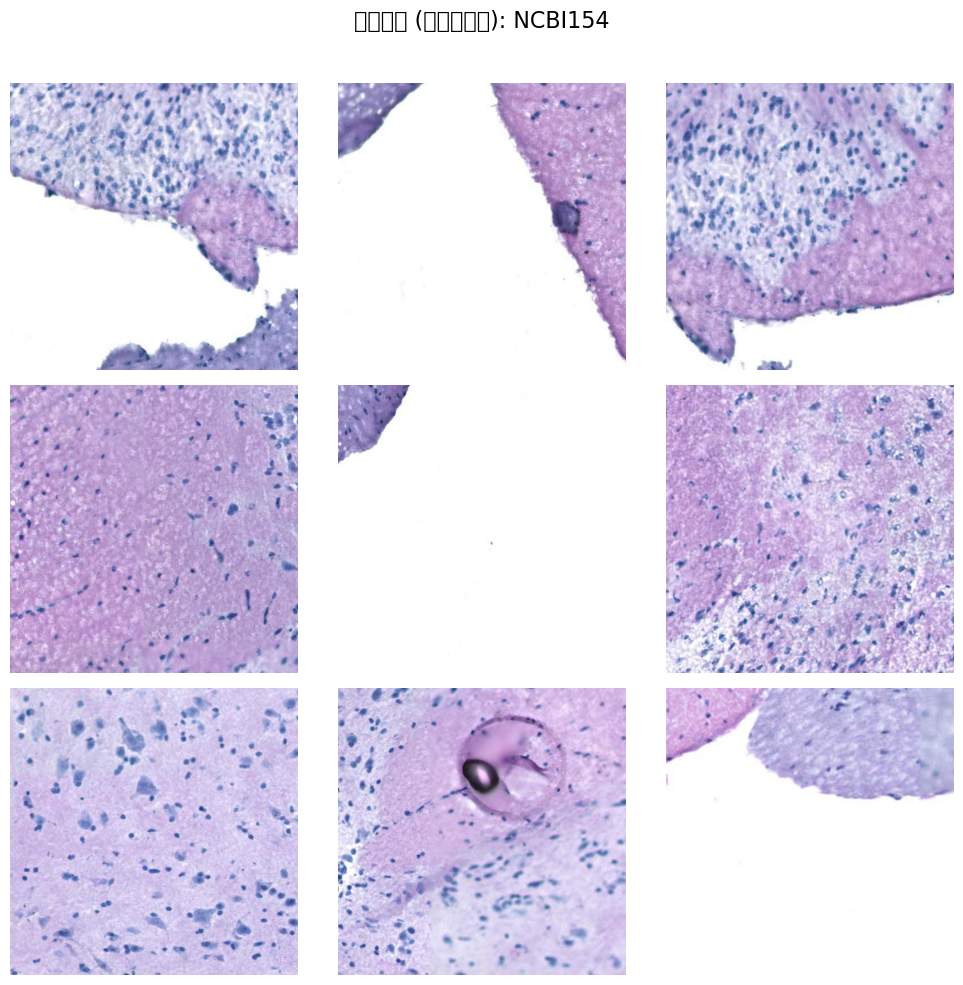

In [13]:



"""主执行函数"""
# --- 配置 ---
# !! 修改为您的 HEST 数据集根目录
QC_RESULTS_CSV = "wsi_tiling_qc_results.csv"

if not os.path.exists(QC_RESULTS_CSV):
    print(f"错误: QC 结果文件 '{QC_RESULTS_CSV}' 不存在。")
    print("请先运行 QC 计算脚本。")
    
if not os.path.isdir(DATA_DIR):
    print(f"错误: HEST 数据目录 '{DATA_DIR}' 不存在。")

# --- 1. 加载并分析整体 QC 数据 ---
qc_df = pd.read_csv(QC_RESULTS_CSV)
# 移除没有有效瓦片的行
qc_df_valid = qc_df.dropna(subset=['mean_blurriness_laplacian']).copy()

plot_qc_distributions(qc_df_valid)

# --- 2. 识别并可视化“有问题”和“正常”的样本 ---
print("\n--- 3. 识别和对比样本瓦片 ---")
hest_dataset = HESTDataset(DATA_DIR)

# 我们将使用“模糊度”作为示例指标
metric_to_compare = 'mean_blurriness_laplacian'

# 找出最模糊的样本 (模糊度值最低)
blurry_sample_row = qc_df_valid.loc[qc_df_valid[metric_to_compare].idxmin()]
blurry_sample_id = blurry_sample_row['sample_id']
blurry_score = blurry_sample_row[metric_to_compare]
print(f"最模糊的样本: {blurry_sample_id} (模糊度得分: {blurry_score:.2f})")

# 找出处于中位数的“正常”样本
median_blurriness = qc_df_valid[metric_to_compare].median()
# 找到最接近中位数的样本
normal_sample_row = qc_df_valid.iloc[(qc_df_valid[metric_to_compare] - median_blurriness).abs().argsort()[:1]]
normal_sample_id = normal_sample_row['sample_id'].iloc[0]
normal_score = normal_sample_row[metric_to_compare].iloc[0]
print(f"正常的样本 (接近中位数): {normal_sample_id} (模糊度得分: {normal_score:.2f})")

# 获取这两个样本的 HESTSample 对象
samples_to_viz = hest_dataset.get_samples(sample_ids=[blurry_sample_id, normal_sample_id])
blurry_sample = next((s for s in samples_to_viz if s.sample_id == blurry_sample_id), None)
normal_sample = next((s for s in samples_to_viz if s.sample_id == normal_sample_id), None)

# 可视化瓦片进行对比
if blurry_sample:
    visualize_sample_tiles(blurry_sample, num_tiles=9, title_prefix="问题样本 (低模糊度)")

if normal_sample:
    visualize_sample_tiles(normal_sample, num_tiles=9, title_prefix="正常样本 (中位模糊度)")
    
# 您也可以对其他指标重复此过程，例如对比度和亮度
# metric_to_compare = 'mean_contrast'
# ...

In [15]:
def visualize_sample_tiles_fast(
    sample: HESTSample,
    num_tiles: int = 9,
    tile_size: int = 512,
    title_prefix: str = ""
):
    """
    通过多线程并行读取来快速从 WSI 中提取并显示一组随机的高分辨率瓦片。

    参数:
      sample (HESTSample): 要可视化的样本。
      num_tiles (int): 要显示的瓦片数量。
      tile_size (int): 每个瓦片的尺寸。
      title_prefix (str): 添加到图像网格标题前的前缀。
    """
    # 1. 定位组织区域 (这部分很快，保持串行)
    wsi = sample.load_wsi()
    if not wsi:
        print(f"无法为 {sample.sample_id} 加载 WSI。")
        return

    try:
        level0_dims = wsi.level_dimensions[0]
        thumb_downsample = 64
        thumb = sample.get_wsi_thumbnail(level=0, downsample=thumb_downsample)
        if thumb.size == 0: return

        gray_thumb = cv2.cvtColor(thumb, cv2.COLOR_RGB2GRAY)
        try:
            thresh_val = cv2.threshold(gray_thumb, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[0]
            tissue_mask_thumb = (gray_thumb < thresh_val)
        except cv2.error:
            tissue_mask_thumb = np.zeros(gray_thumb.shape, dtype=bool)

        tissue_y_thumb, tissue_x_thumb = np.where(tissue_mask_thumb)

        if len(tissue_x_thumb) == 0:
            print(f"在 {sample.sample_id} 中未检测到组织，无法采样瓦片。")
            return

        # 随机选择所有瓦片的坐标
        random_indices = np.random.choice(len(tissue_x_thumb), size=num_tiles, replace=True)
        top_left_x = tissue_x_thumb[random_indices] * thumb_downsample
        top_left_y = tissue_y_thumb[random_indices] * thumb_downsample
        coords_to_read = [(int(x), int(y)) for x, y in zip(top_left_x, top_left_y)]

    finally:
        # 关闭用于生成缩略图的 WSI 对象
        if wsi:
            wsi.close()

    # 2. 使用线程池并行读取瓦片 (这是提速的关键)
    tiles_np = []
    print(f"正在为 {sample.sample_id} 并行读取 {num_tiles} 个瓦片...")
    with concurrent.futures.ThreadPoolExecutor() as executor:
        # 为每个坐标提交一个读取任务
        future_to_tile = {executor.submit(_read_single_tile, sample.wsi_path, coord, tile_size): coord for coord in coords_to_read}
        
        # 使用tqdm显示进度，并按完成顺序收集结果
        for future in tqdm(concurrent.futures.as_completed(future_to_tile), total=len(coords_to_read)):
            tiles_np.append(future.result())

    # 3. 绘制所有已加载到内存的瓦片 (这部分很快)
    grid_size = math.ceil(math.sqrt(num_tiles))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
    axes = axes.flatten()
    fig.suptitle(f"{title_prefix}: {sample.sample_id}", fontsize=16)

    for i, tile_data in enumerate(tiles_np):
        if i >= len(axes): break
        axes[i].imshow(tile_data)
        axes[i].axis('off')

    # 隐藏多余的子图
    for j in range(i, len(axes)):
        axes[j].set_axis_off()

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

--- Using fast visualization to compare samples with different quality metrics ---

--- mean_blurriness_laplacian Comparison (Sharpness) ---
Problem Sample (Low Blurriness): NCBI660 (mean_blurriness_laplacian: 2.70)
Quality Sample (High Blurriness): MISC7 (mean_blurriness_laplacian: 6480.25)
正在为 NCBI660 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

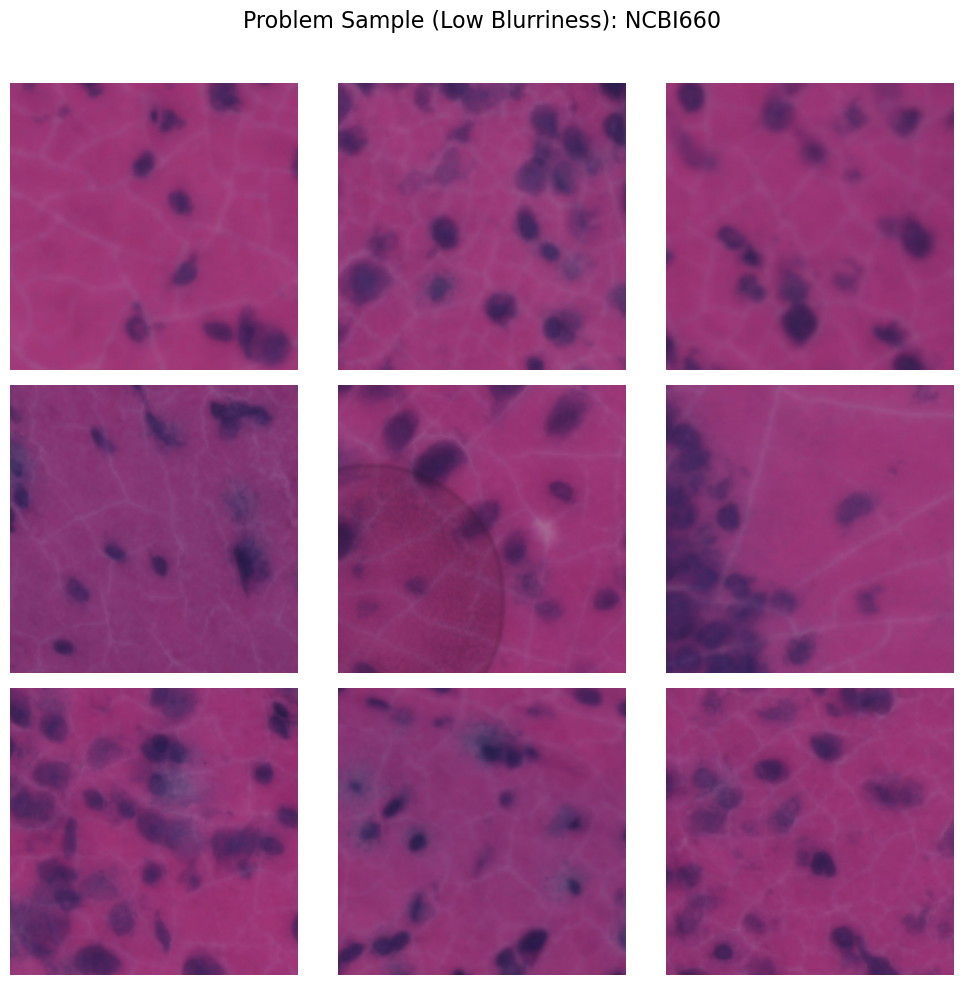

正在为 MISC7 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

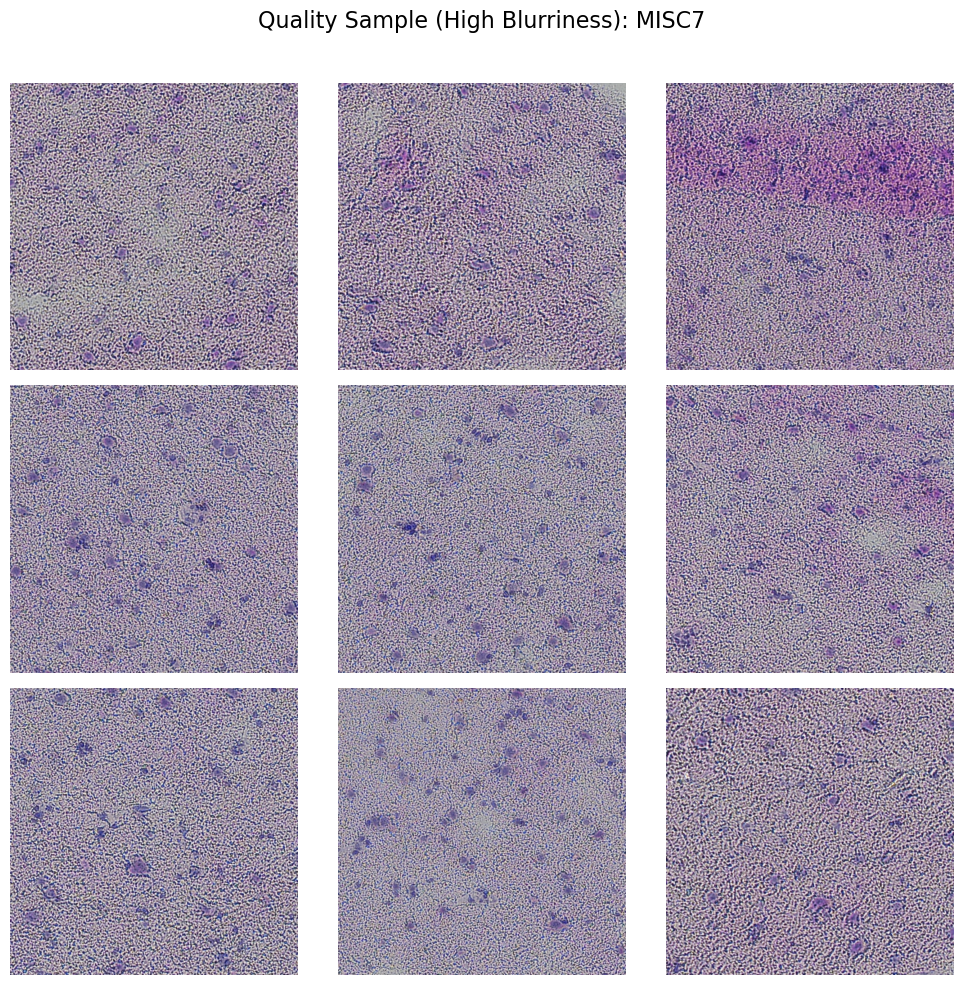


--- mean_contrast Comparison (Contrast) ---
Problem Sample (Low Contrast): NCBI470 (mean_contrast: 11.32)
Quality Sample (High Contrast): TENX96 (mean_contrast: 102.79)
正在为 NCBI470 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

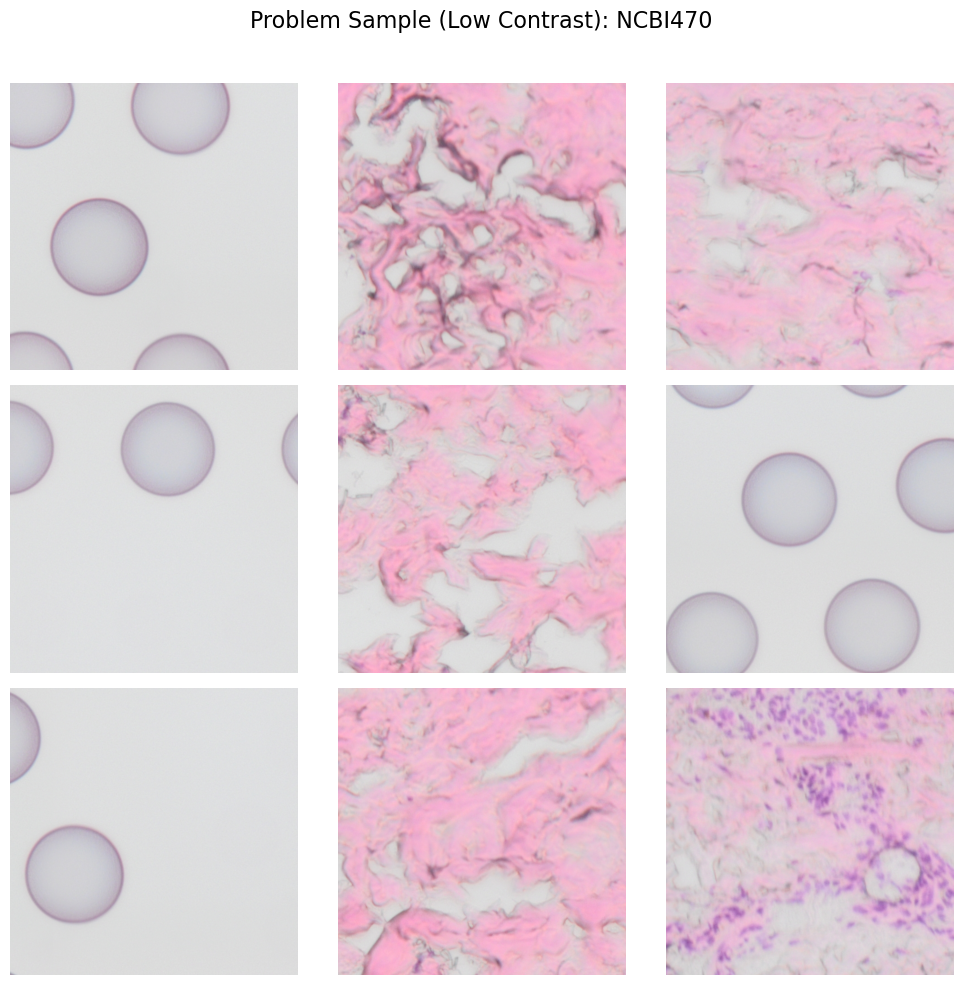

正在为 TENX96 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

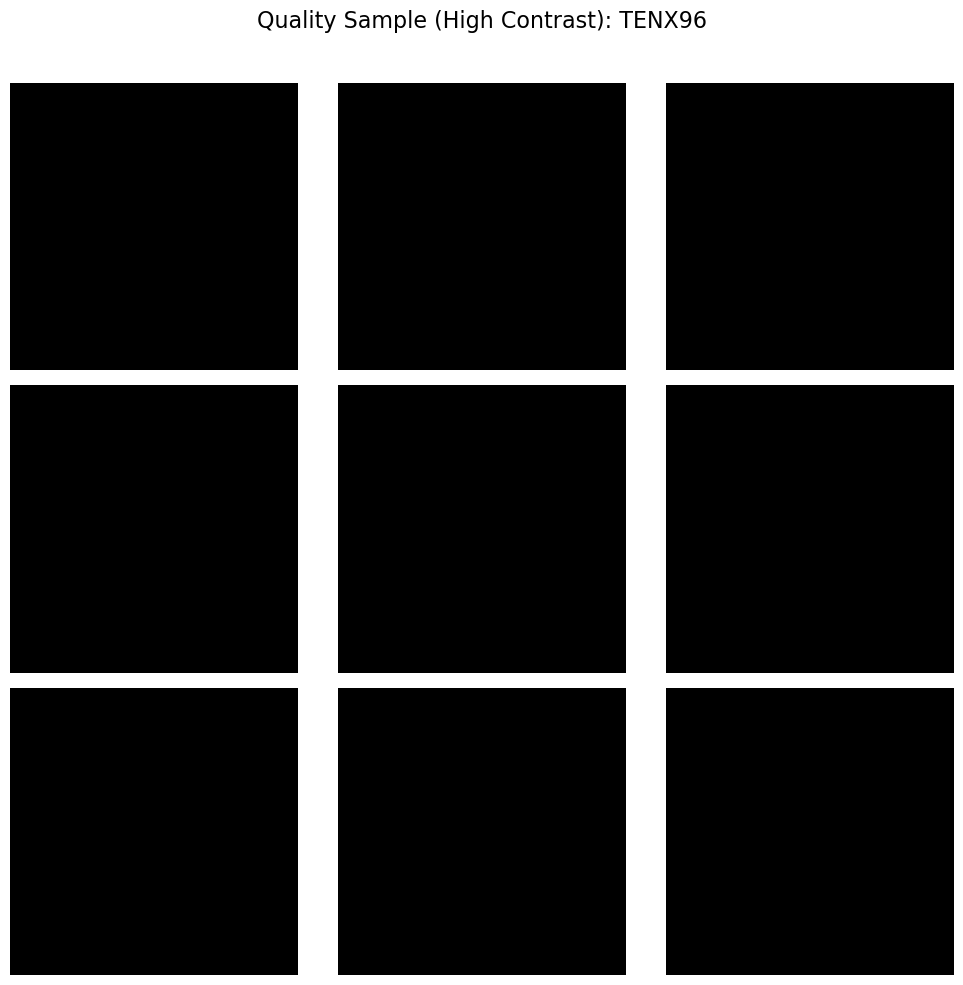


--- mean_brightness Comparison (Brightness) ---
Problem Sample (Too Dark): TENX99 (mean_brightness: 13.10)
Normal Sample (Median Brightness): MISC130 (mean_brightness: 165.38)
正在为 TENX99 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

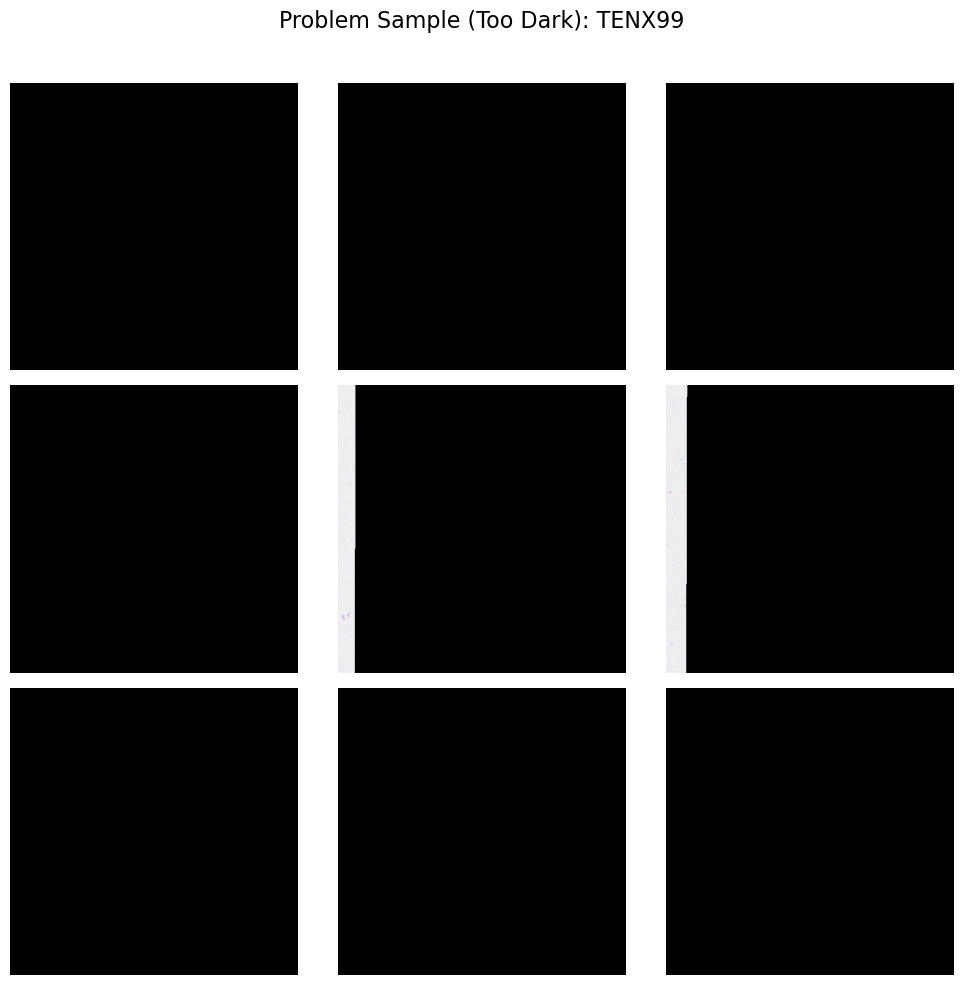

正在为 MISC130 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

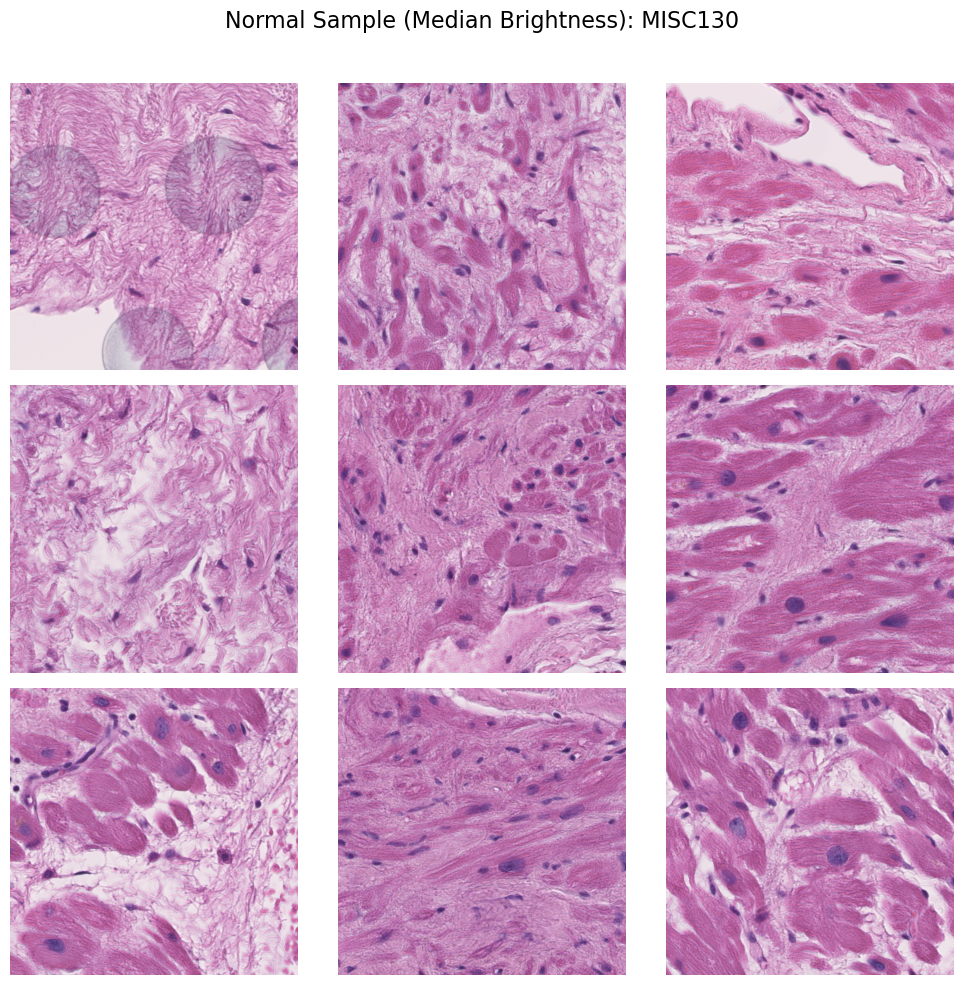


--- tissue_area_fraction Comparison (Tissue Coverage) ---
Problem Sample (Too Small Tissue Area): TENX99 (tissue_area_fraction: 0.01)
Normal Sample (Median Tissue Area): NCBI115 (tissue_area_fraction: 0.28)
正在为 TENX99 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

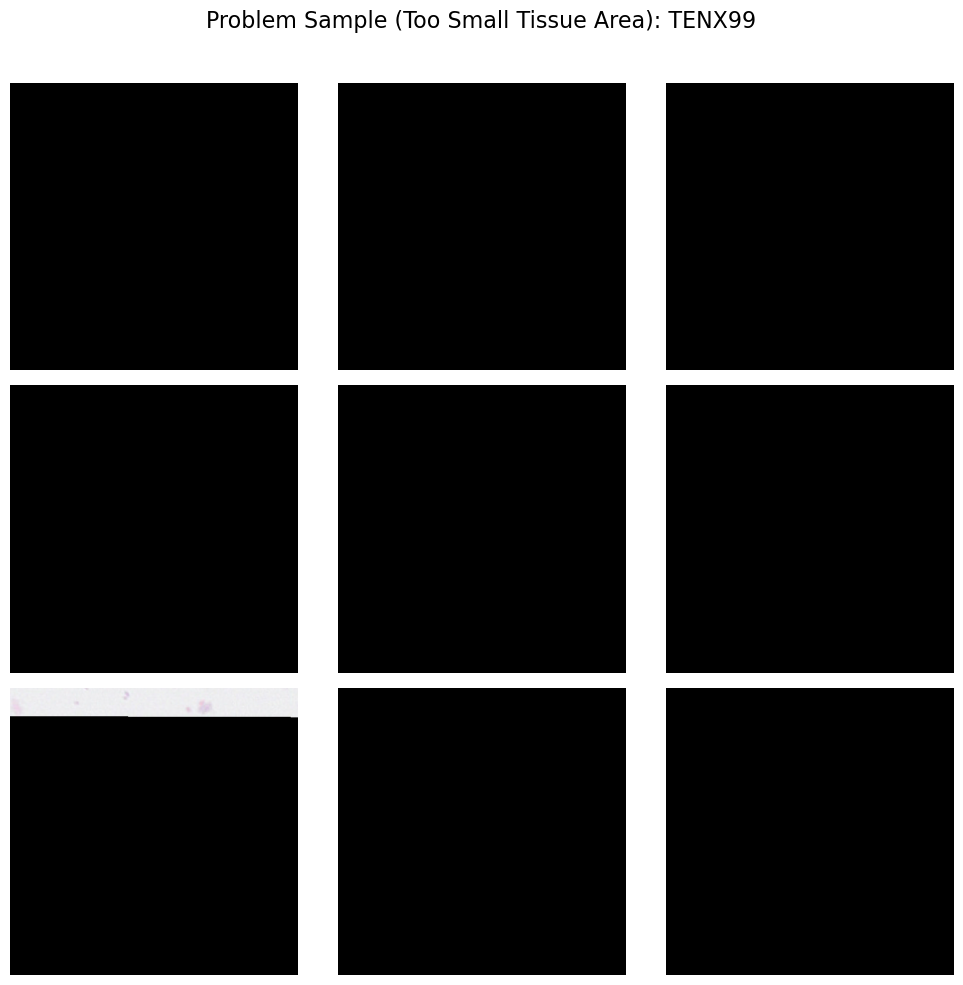

正在为 NCBI115 并行读取 9 个瓦片...


  0%|          | 0/9 [00:00<?, ?it/s]

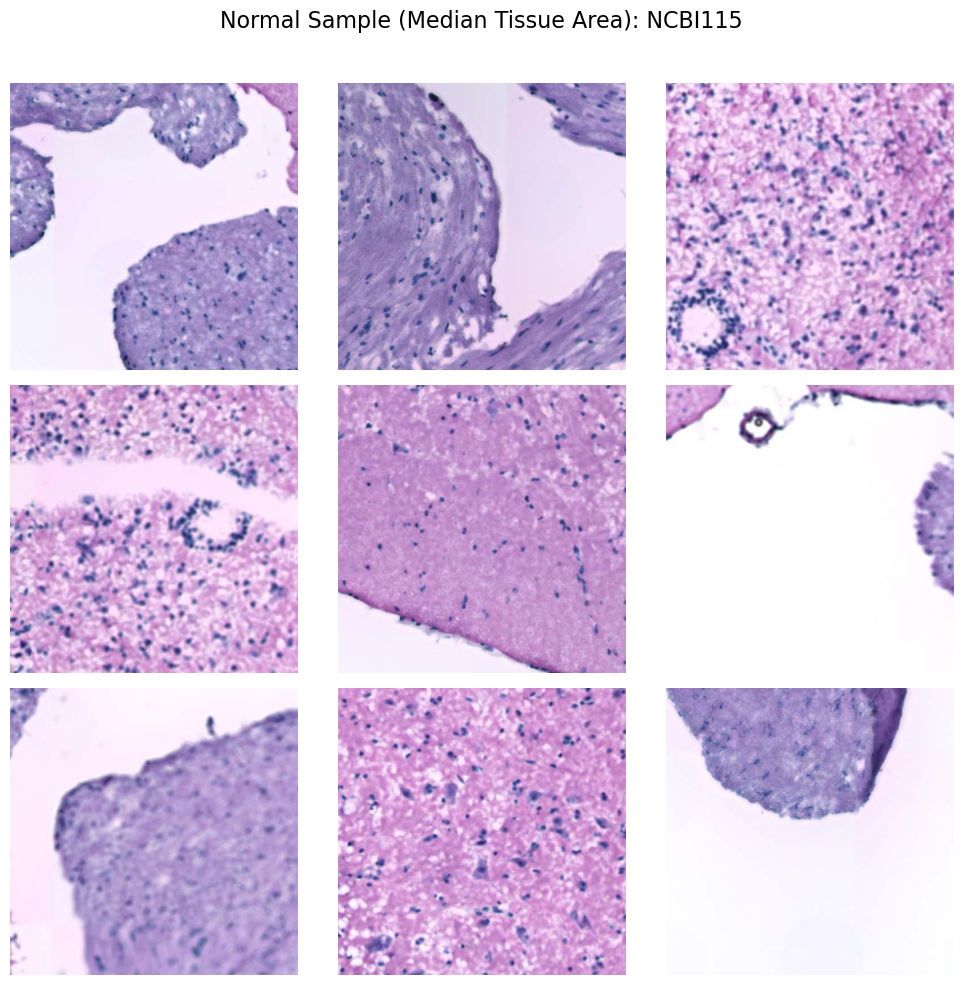

In [16]:
# Define a helper function for quick comparison
def compare_samples_by_metric(metric_name, title_suffix=""):
    """
    Compare worst and best samples using the specified metric
    """
    if metric_name not in qc_df_valid.columns:
        print(f"Metric {metric_name} does not exist in the data")
        return
    
    # Determine whether higher or lower values are better based on the metric's meaning
    if metric_name == 'mean_blurriness_laplacian':
        # Blurriness: higher is better (clearer)
        worst_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmin()]
        best_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmax()]
        worst_label = "Problem Sample (Low Blurriness)"
        best_label = "Quality Sample (High Blurriness)"
    elif metric_name == 'mean_brightness':
        # Brightness: take normal samples near median and extreme values
        median_val = qc_df_valid[metric_name].median()
        worst_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmin()]  # Darkest
        best_sample_row = qc_df_valid.iloc[(qc_df_valid[metric_name] - median_val).abs().argsort()[:1]]
        worst_label = "Problem Sample (Too Dark)"
        best_label = "Normal Sample (Median Brightness)"
    elif metric_name == 'mean_contrast':
        # Contrast: higher is better
        worst_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmin()]
        best_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmax()]
        worst_label = "Problem Sample (Low Contrast)"
        best_label = "Quality Sample (High Contrast)"
    elif metric_name == 'tissue_area_fraction':
        # Tissue area fraction: take median and extreme values
        median_val = qc_df_valid[metric_name].median()
        worst_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmin()]  # Least tissue
        best_sample_row = qc_df_valid.iloc[(qc_df_valid[metric_name] - median_val).abs().argsort()[:1]]
        worst_label = "Problem Sample (Too Small Tissue Area)"
        best_label = "Normal Sample (Median Tissue Area)"
    else:
        # Default: take minimum and maximum values
        worst_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmin()]
        best_sample_row = qc_df_valid.loc[qc_df_valid[metric_name].idxmax()]
        worst_label = f"Problem Sample (Low {metric_name})"
        best_label = f"Quality Sample (High {metric_name})"
    
    # Get sample IDs and scores
    if isinstance(worst_sample_row, pd.Series):
        worst_sample_id = worst_sample_row['sample_id']
        worst_score = worst_sample_row[metric_name]
    else:
        worst_sample_id = worst_sample_row['sample_id'].iloc[0]
        worst_score = worst_sample_row[metric_name].iloc[0]
    
    if isinstance(best_sample_row, pd.Series):
        best_sample_id = best_sample_row['sample_id']
        best_score = best_sample_row[metric_name]
    else:
        best_sample_id = best_sample_row['sample_id'].iloc[0]
        best_score = best_sample_row[metric_name].iloc[0]
    
    print(f"\n--- {metric_name} Comparison {title_suffix} ---")
    print(f"{worst_label}: {worst_sample_id} ({metric_name}: {worst_score:.2f})")
    print(f"{best_label}: {best_sample_id} ({metric_name}: {best_score:.2f})")
    
    # Get sample objects
    samples_to_compare = hest_dataset.get_samples(sample_ids=[worst_sample_id, best_sample_id])
    worst_sample = next((s for s in samples_to_compare if s.sample_id == worst_sample_id), None)
    best_sample = next((s for s in samples_to_compare if s.sample_id == best_sample_id), None)
    
    # Use fast visualization
    if worst_sample:
        visualize_sample_tiles_fast(worst_sample, num_tiles=9, title_prefix=worst_label)
    
    if best_sample:
        visualize_sample_tiles_fast(best_sample, num_tiles=9, title_prefix=best_label)

# First need to define the missing function
def _read_single_tile(wsi_path, coord, tile_size):
    """Helper function to read a single tile"""
    try:
        wsi = openslide.open_slide(wsi_path)
        tile_pil = wsi.read_region(coord, 0, (tile_size, tile_size))
        tile_np = np.array(tile_pil.convert("RGB"))
        wsi.close()
        return tile_np
    except Exception as e:
        print(f"Error reading tile: {e}")
        return np.zeros((tile_size, tile_size, 3), dtype=np.uint8)

# Compare different metrics
print("--- Using fast visualization to compare samples with different quality metrics ---")

# 1. Blurriness comparison
compare_samples_by_metric('mean_blurriness_laplacian', "(Sharpness)")

# 2. Contrast comparison  
compare_samples_by_metric('mean_contrast', "(Contrast)")

# 3. Brightness comparison
compare_samples_by_metric('mean_brightness', "(Brightness)")

# 4. Tissue area fraction comparison
compare_samples_by_metric('tissue_area_fraction', "(Tissue Coverage)")

In [19]:
# 获取TENX99的路径
tenx99_sample = hest_dataset.get_samples(sample_ids=['TENX99'])
tenx99_tifpath = tenx99_sample[0].wsi_path if tenx99_sample else None

In [21]:
# Read the tiff file using OpenSlide
if tenx99_tifpath:
    try:
        tenx99_wsi = openslide.open_slide(tenx99_tifpath)
        print(f"成功加载 TENX99 WSI: {tenx99_tifpath}")
    except Exception as e:
        print(f"加载 TENX99 WSI 时出错: {e}")

成功加载 TENX99 WSI: /cwStorage/nodecw_group/jijh/hest_1k/wsis/TENX99.tif


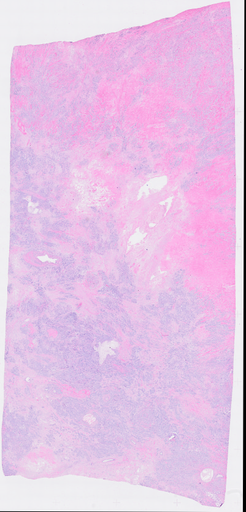

In [26]:
tenx99_wsi.get_thumbnail((512, 512))

# 对之前处理好的数据进行染色处理

In [ ]:
import pandas as pd
import os
from typing import Set, Literal

def get_housekeeping_genes(
    species: Literal['human', 'mouse'] = 'mouse', # 为您的Mus musculus数据调整默认值
    cache_dir: str = ".cache"
) -> Set[str]:
    """从The Human Protein Atlas数据库获取并缓存管家基因列表。"""
    os.makedirs(cache_dir, exist_ok=True)
    
    urls = {
        'human': 'https://www.proteinatlas.org/assets/resources/download/proteinatlas_housekeeping.tsv.zip',
        'mouse': 'https://www.proteinatlas.org/assets/resources/download/proteinatlas_mouse_housekeeping.tsv.zip'
    }
    
    if species not in urls:
        raise ValueError("物种必须是 'human' 或 'mouse'")
        
    filename = f"housekeeping_{species}.tsv.zip"
    cache_path = os.path.join(cache_dir, filename)
    
    if not os.path.exists(cache_path):
        print(f"正在从 The Human Protein Atlas 下载 {species} 管家基因列表...")
        try:
            df_hpa = pd.read_csv(urls[species], sep='\t')
            df_hpa.to_csv(cache_path, sep='\t', compression='zip', index=False)
            print(f"列表已下载并缓存至: {cache_path}")
        except Exception as e:
            print(f"自动下载失败: {e}\n请手动从 {urls[species]} 下载并保存为 '{cache_path}'")
            return set()
    else:
        print(f"从缓存加载 {species} 管家基因列表...")

    df_hpa = pd.read_csv(cache_path, sep='\t', compression='zip')
    
    if 'Gene' not in df_hpa.columns:
        raise ValueError("在下载的文件中未找到 'Gene' 列。")
        
    housekeeping_set = set(df_hpa['Gene'].unique())
    print(f"成功加载 {len(housekeeping_set)} 个 {species} 管家基因。")
    
    return housekeeping_set

ModuleNotFoundError: No module named 'spams'